# Lập trình song song - Đồ án cuối kỳ

**Môn học**: Lập trình song song

**Đề bài**: Song song hoá và tối ưu hoá một ứng dụng

**Thành viên nhóm**:
* 19120207 - Hồ Hoàng Duy
* 19120454 - Bùi Quang Bảo
* 19120462 - Lục Minh Bửu

**Mục lục**:

I. Giới thiệu về đồ án
* 1. Mô tả ứng dụng: Seam Carving
* 2. Cài đặt
  * 2.1. Cài đặt tuần tự
  * 2.2. Cài đặt song song
  * 2.3. Tối ưu hoá 1
  * 2.4. Tối ưu hoá 2
* 3. Thí nghiệm và kết quả
  * 3.1. Testcases
  * 3.2. Kết quả
* 4. Đánh giá đồ án
  * 4.1. Kết quả đồ án
  * 4.2. Quá trình làm đồ án
* 5. Tài liệu tham khảo

II. Cài đặt và thí nghiệm (Code)

# I. Giới thiệu về đồ án

## 1. Mô tả ứng dụng: Seam Carving

* **Ứng dụng**: Thay đổi kích thước ảnh bằng phương pháp “Seam Carving”
* **Input**: 1 tấm ảnh RGB
* **Output**: tấm ảnh được thay đổi kích thước mà không làm biến dạng các đối tượng quan trọng (ở đồ án này: tấm ảnh được thu hẹp theo chiều rộng)
* **Ý nghĩa trong thực tế**:
  - Sử dụng để resize 1 tấm ảnh mà không làm biến dạng hay mất đi các đối tượng quan trọng -> cùng 1 tấm ảnh có thể sử dụng cho nhiều thiết bị hoặc media có kích thước khác nhau (Ví dụ: banner của Youtube và Facebook có tỉ lệ khác nhau, 1 người dùng muốn sử dụng 1 bức ảnh cho cả 2 nền tảng có thể sử dụng Seam Carving thay vì Crop hay Scaling)
* Ứng dụng này **cần tăng tốc** vì chạy khá chậm nếu cài đặt tuần tự.

|         | Original Image | Scaling | Cropping | Seam Carving |
|---------|----------------|---------|----------|--------------|
| Ví dụ | 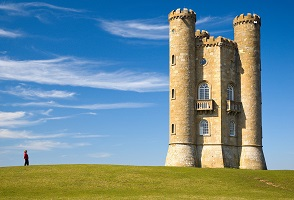 | 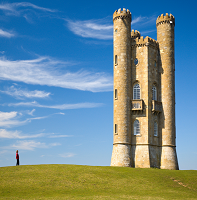 | 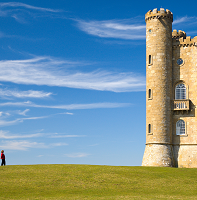 | 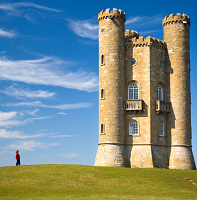  |
| Mô tả | Ảnh gốc | Vật thể quan trọng bị co lại | Vật thể quan trọng bị xoá bỏ | Vật thể quan trọng giữ được hình dạng |

*Nguồn ảnh: [Wikipedia - Seam Carving](https://en.wikipedia.org/wiki/Seam_carving)*

## 2. Cài đặt

### 2.1. Cài đặt tuần tự:

Ứng dụng Seam Carving của nhóm được thiết kế như sau:

#### Các bước để remove 1 seam:
1. **Input** là 1 ảnh
2. **Grayscale** ảnh đó
  * grayscale = 0.299 x red + 0.587 x green + 0.114 x blue
3. Tính độ quan trọng (**Energy**) của mỗi pixel ảnh
  * Edge Detection: Áp dụng convolution bằng cách kết hợp 2 filter `sobel_x` và `sobel_y`
4. Từ energy, tính các seams của ảnh (bằng dynamic programming) -> **Minimal Energy**
  * Seams: các "đường" đi từ các pixel ở hàng đầu tiên đến hàng cuối cùng mà có energy thấp nhất
  * **vMinEnergy**: tổng energy của các cột -> sẽ sử dụng để hỗ trợ lựa chọn min_seam ở bước sau (khi có nhiều seam cùng đạt min energy, việc lựa chọn seam nào sẽ dựa vào vMinEnergy)
  * **Backtrack**: Trong quá trình tính Minimal Energy, lưu lại hướng mà seam di chuyển để sau đó có thể truy lại seam.
5. Loại bỏ seam ít quan trọng nhất (seam có energy thấp nhất)
  * Tìm pixel ở hàng đầu tiên có giá trị Minimal Energy thấp nhất -> điều đó có nghĩa là seam bắt đầu từ điểm này sẽ là seam có energy thấp nhất -> **min_seam**
  * Backtrack để tìm min_seam này
  * Copy input sang output, trừ những pixel thuộc min_seam
6. **Output** là ảnh input đã được loại bỏ 1 seam ít quan trọng nhất

Lặp lại qui trình trên với số lần mong muốn để thay đổi kích thước ảnh.

#### Ảnh minh hoạ một số bước trong quá trình thực hiện Seam Carving:

|             | Original Image | Grayscale | Edge (Energy) | Minimal Energy |
|-------------|----------------|-----------|---------------|----------------|
| Test case 0 | 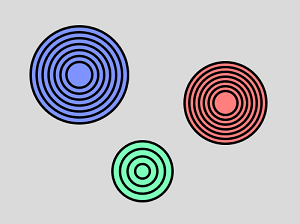 | 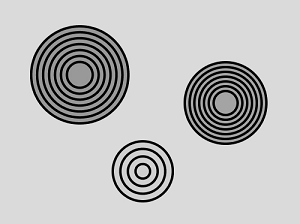 | 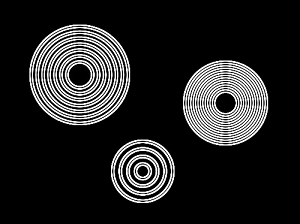 | 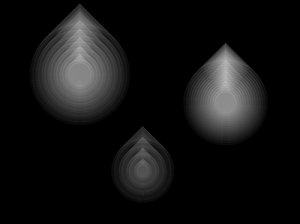 |
| Test case 1 | 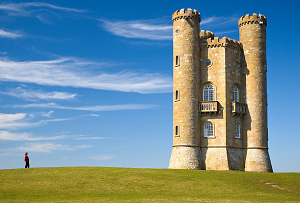 | 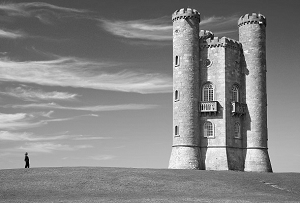 | 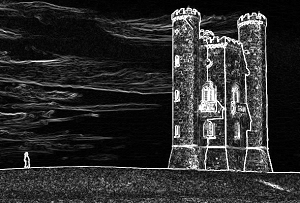 | 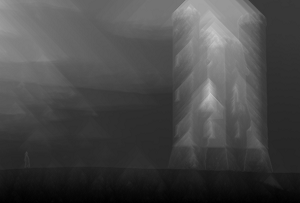 |
| Test case 2 | 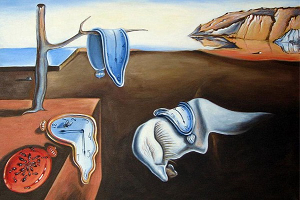 | 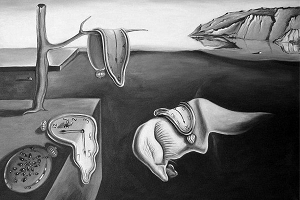 | 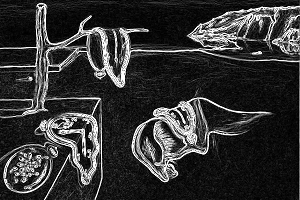 | 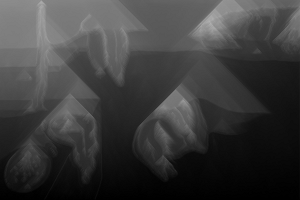 |
| Test case 3 | 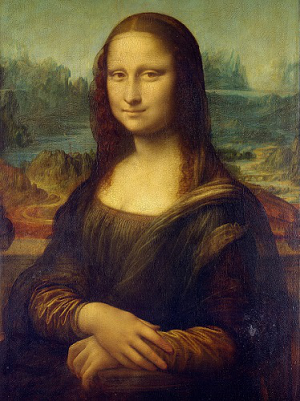 | 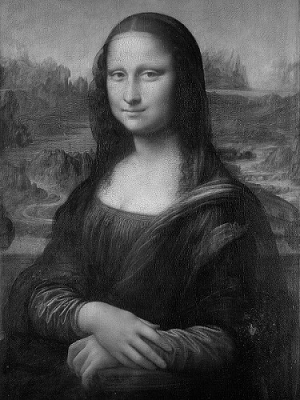 | 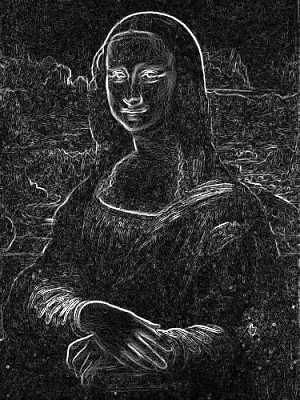 | 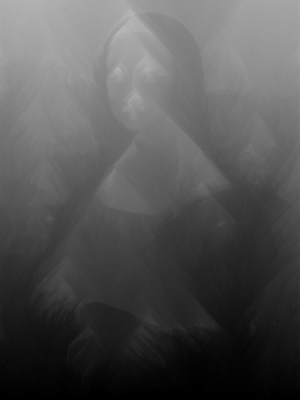 |

**Nguồn ảnh**:

* **Ảnh gốc**:
  - Test case 0: Do nhóm tự tạo ra để test
  - Test case 1: Bức ảnh "Broadway Tower" ([Wikipedia](https://en.wikipedia.org/wiki/Seam_carving))
  - Test case 2: Bức tranh "The Persistence of Memory" của hoạ sĩ Salvador Dali ([Wikipedia](https://en.wikipedia.org/wiki/The_Persistence_of_Memory))
  - Test case 3: Bức tranh "Mona Lisa" của hoạ sĩ Leonardo da Vinci ([Wikipedia](https://en.wikipedia.org/wiki/Mona_Lisa))
* **Ảnh grayscale, edge (energy) và min energy**:
  - Bằng chương trình của nhóm thực hiện

### 2.2. Cài đặt song song

**Ý tưởng**: Sử dụng phương pháp "Chia để trị"
* Chia Seam Carving (1 thuật toán lớn) thành nhiều công đoạn nhỏ ít ảnh hưởng đến nhau và tiến hành song song hoá các công đoạn đó

**Những công đoạn được song song hoá**:
* Grayscale ảnh
* Tính Energy của ảnh (edge detection bằng convolution)
* Tính vMinEnergy
* Loại bỏ seam ít quan trọng nhất

**Lí do chọn những công đoạn này**:
* Những công đoạn này bao gồm nhiều vòng lặp for, phần nhiều là lặp qua các dòng, trong đó lại lặp qua các cột -> có khả năng tăng tốc độ bằng song song hoá
* Những công đoạn này hoạt động khá độc lập với nhau và có thể thực hiện song song hoá từng công đoạn

### 2.3. Tối ưu hoá 1

**Những điểm được tối ưu hoá**:

* Sử dụng CMEM thay cho GMEM đối với một số biến có giá trị không thay đổi như:
  * Giá trị của filter `sobel_x`
  * Giá trị của filter `sobel_y`
* Thay vì xem quá trình Seam Carving gồm các công đoạn tách biệt như ở bản cài song song gốc, thì cài đặt quá trình này một cách liền mạch (tái sử dụng các biến được dùng chung cho các công đoạn,...):
  * Giảm số lần copy kết quả grayscale từ host sang device
  * Giảm số lần copy kết quả tính energy từ host sang device
  * Giảm số lần copy ảnh input từ host sang device

### 2.4. Tối ưu hoá 2

**Những điểm được tối ưu hoá**:  Trong phiên bản này, nhóm tiến hành overlap 3 bước là copy input, grayscale và convolution vào n streams được nhập vào từ input. Trong đó mỗi stream sẽ thực hiện lần lượt 3 bước trên. Trong khi các bước còn lại thì thực thi tuần tự như phiên bản tối ưu hoá 1.

## 3. Thí nghiệm và kết quả:

### 3.1. Testcases

* **Testcase 0**: `base.pnm`
  
  ➜ Hình ảnh (do nhóm tự tạo với mục đích dễ dàng quan sát trong quá trình cài đặt) có 3 vật thể quan trọng, rõ ràng và tách biệt.

* **Testcase 1**: `tower.pnm`
  
  ➜ Hình ảnh có 2 vật thể quan trọng, rõ ràng, bao gồm một người ở bên trái và một toà tháp ở bên phải.

* **Testcase 2**: `dali.pnm` 

  ➜ Hình ảnh có nhiều vật thể, có chỗ tách biệt có chỗ overlap nhau, sắp xếp lộn xộn.

* **Testcase 3**: `monalisa.pnm` 

  ➜ Hình ảnh chân dung, có rất nhiều chi tiết đan xen trộn lẫn vào nhau.

### 3.2. Kết quả

Lần lượt thí nghiệm trên các testcases trên với các phiên bản cài đặt khác nhau, chương trình cho ra kết quả như sau:

| Processing Time      | Test case 0 | Test case 1 | Test case 2 | Test case 3 |
|----------------------|-------------|-------------|-------------|-------------|
| Host                 | 24115 ms    | 34110 ms    | 27172 ms    | 19785 ms    |
| Device               | 20419 ms    | 27821 ms    | 23243 ms    | 16631 ms    |
| Device (Opt 1)       | 14129 ms    | 19630 ms    | 16442 ms    | 11411 ms    |
| Device (Opt 2)       | 14489 ms       | 19758 ms          | 16115 ms          | 11308 ms          |


* Đối với blocksize = 16x16 và 32x32, chương trình cho ra kết quả đúng.
* Đối với blocksize = 64x64, chương trình cho ra kết quả sai.

|             | Input Image | Output Image |
|-------------|-------------|--------------|
| Test case 0 | 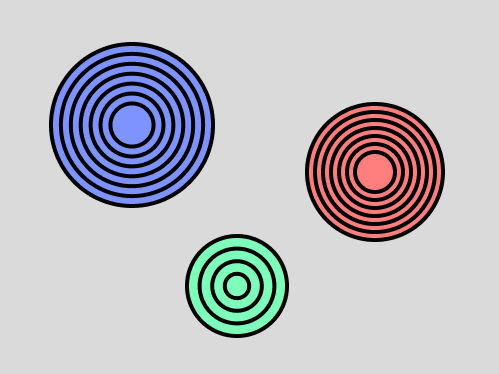 | 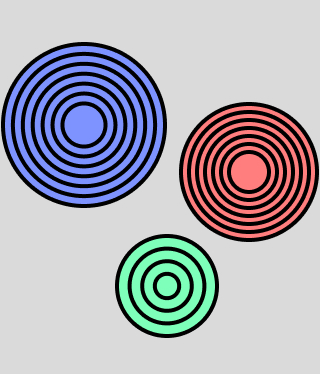 |
| Test case 1 | 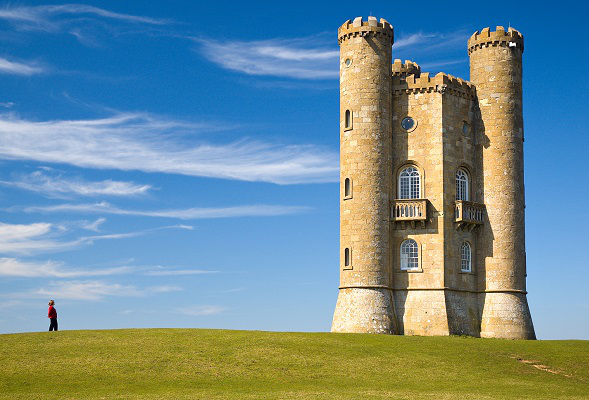 | 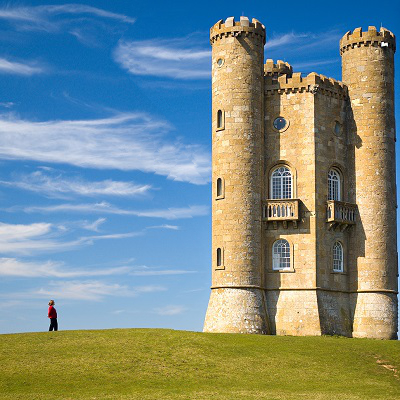 |
| Test case 2 | 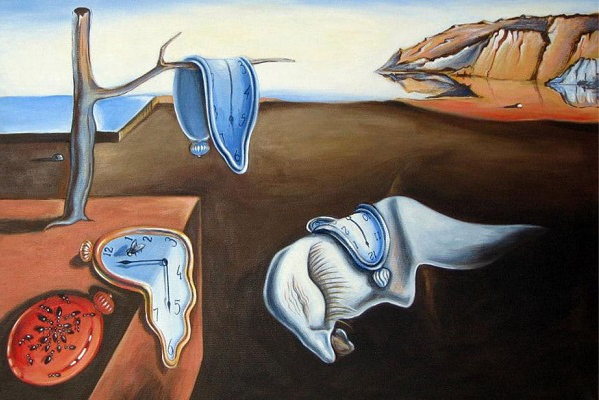 | 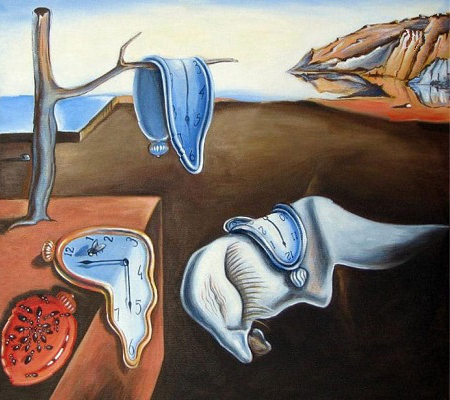 |
| Test case 3 | 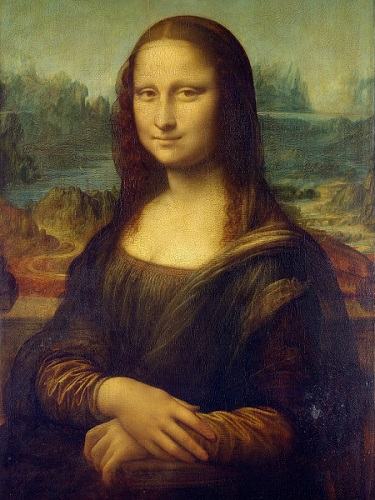 | 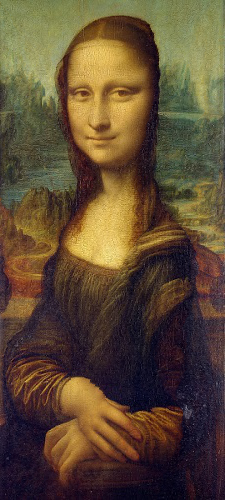 |

## 4. Đánh giá đồ án

### 4.1. Kết quả đồ án

**Đánh giá từ output nhận được**:
* Tất cả các phiên bản cài đặt (tuần tự, song song, song song tối ưu 1, song song tối ưu 2) đều cho ra kết quả giống nhau và đúng với mong muốn ban đầu.
* Cụ thể các testcases:
  * **Testcase 0**: Output cho ra **rất tốt**, các hình tròn (vật thể quan trọng) giữ nguyên hình dáng và không bị cắt xén.
  * **Testcase 1**: Output cho ra **tốt**. Giữ nguyên được người ở bên trái và toà tháp ở bên phải (trừ việc toà tháp bị "xén" một xíu ở phần chân phải, nếu xem xét lại Min Energy thì chúng ta sẽ nhận ra rằng, phần mây ở bên trái lại có độ quan trọng nhiều hơn so với phần nhỏ xíu này -> đây là điều hiển nhiên).
  * **Testcase 2**: Output cho ra **tốt**. Những vật thể lớn ở trong hình không bị biến dạng quá nhiều. Thấy rõ rệt sự "xích lại gần" giữa cái đồng hồ (bên trái) và vật thể có 1 cái đồng hồ nằm trên (bên phải).
  * **Testcase 3**: Output cho ra **không tốt lắm**, khi mà vẫn giữ được khuôn mặt của Monalisa, mặc dù mất hơi nhiều tóc. Kết quả của testcase này là hiển nhiên nếu ta xem xét kỹ lại đặc điểm của phần tóc đen và không thay đổi nhiều -> dẫn đến Seam Carving không coi đây là vật thể quan trọng -> loại bỏ. Đây là nhược điểm của SeamCarving (cần một thuật toán khác phân biệt được mặt người với background thì mới làm tốt trên ảnh này).

**Những điều mà nhóm đã làm được**:

* Cài đặt thành công phiên bản tuần tự
* Cài đặt thành công phiên bản song song rút ngắn thời gian so với tuần tự
* Tối ưu hoá lần 1 thành công rút ngắn thời gian so với song song gốc
* **CHECK** --> Tối ưu hoá lần 2 thành công rút ngắn thời gian

**Những điều mà nhóm chưa làm được**:

* Có ý tưởng nhưng chưa song song hoá được công đoạn tính Minimal Energy sử dụng scan

### 4.2. Quá trình làm đồ án

* **Khó khăn:**
  * Hoàng Duy: Đồ án được thực hiện trong thời gian cận Tết và trùng thi lý thuyết/đồ án cuối kỳ các môn khác nên quỹ thời gian dành cho đồ án này không nhiều. Việc gặp mặt trực tiếp để thảo luận khá khó, chủ yếu là trao đổi của messenger và call video GGMeet. Kỹ năng lập trình của bản thân còn chưa tốt, cũng ảnh hưởng không ít đến team. Chưa thành thạo với việc lập trình trên GPU (kiến thức khá khác biệt so với các môn học chuyên ngành khác).
  * Quang Bảo: Chưa tận dụng được hết các kiến thức đã học để tối ưu hoá chương trình, chủ yếu là vì kiến thức khá mới và khó, dẫn đến chưa tiếp thu được sâu.
  * Minh Bửu: Không có nhiều thời gian, kiến thức về lập trình song song còn khá mới.
* **Kiến thức/kinh nghiệm học được:**
  * Hoàng Duy: Hiểu hơn về việc áp dụng song song hoá đã được học vào bài toán thực tiễn (như Seam Carving). Biết thêm về các kỹ thuật xử lý ảnh thông qua đồ án.
  * Quang Bảo: Rút kinh nghiệm cho bản thân trong việc làm việc trên 1 file code lớn, cẩn thận trong quá trình thay đổi tên biến (và cách đặt tên biến) đối với những trường hợp đã "lỡ" đặt tên biến hơi "na ná" nhau (ví dụ như `min_seam_idx`, `min_seam`, `min_e_seam_track`,...).
  * Minh Bửu: Cách team work, tự mình cài được một thuật toán có tính ứng dụng, nghiên cứu được kỹ hơn các kỹ thuật của lập trình song song.
* **Nhóm nếu có thêm thời gian thì sẽ**:
  * Tiến hành song song hoá công đoạn tính Minimal Energy
  * Visualize min_seam để dễ dàng trình bày về đồ án nhóm hơn (hiện tại chỉ visualize grayscale, energy và minimal energy)

## 5. Tài liệu tham khảo

* Wikipedia - Seam carving: https://en.wikipedia.org/wiki/Seam_carving
* Seam Carving | Week 2 | 18.S191 MIT Fall 2020 | Grant Sanderson: https://www.youtube.com/watch?v=rpB6zQNsbQU
* Seam Carving: Live Coding Session | Week 2 | MIT 18.S191 Fall 2020 | James Schloss: https://www.youtube.com/watch?v=ALcohd1q3dk
* Blog - Stepping Into the Filter: https://cse442-17f.github.io/Sobel-Laplacian-and-Canny-Edge-Detection-Algorithms/

# II. Cài đặt và Thí nghiệm

## Nhập thư viện và chuẩn bị các hàm

In [1]:
# Import libraries
import numpy as np
import imageio
from PIL import Image
from numba import cuda

# Functionality: Convert JPG/PNG file to PNM file
def convertToPNM(file_name):
  img = imageio.imread(file_name)
  width = img.shape[1]
  height = img.shape[0]
  numChannels = img.shape[2]
  f = open(file_name[0:-4] + ".pnm", "w")
  f.write("P3\n")
  f.write(str(width) + " " + str(height) + "\n")
  f.write("255\n")
  for h in range(height):
    for w in range(width):
      for c in range(numChannels):
        f.write(str(img[h][w][c]) + " ")
    f.write("\n")
  f.close()

# Functionality: Display PNM file as image in notebook
def show_pnm(file_name):
  with open(file_name, 'r') as f:
    vals = f.read().split()
  w = int(vals[1])
  h = int(vals[2])
  print("(" + str(w) + " x " + str(h) + ")")
  if vals[0] == 'P2': # Grayscale image
    pixels = np.array(vals[4:], dtype=np.uint8).reshape((h, w))
  elif vals[0] == 'P3': # RGB image
    pixels = np.array(vals[4:], dtype=np.uint8).reshape((h, w, 3))
  else:
    return None
  return Image.fromarray(pixels)

# Get device information
major, minor = cuda.get_current_device().compute_capability
print(f'GPU compute capability: {major}.{minor}')

GPU compute capability: 7.5


In [2]:
# convertToPNM("base.jpg")
# convertToPNM("tower.jpg")
# convertToPNM("dali.jpg")
# convertToPNM("monalisa.jpg")

## Biên dịch chương trình

In [3]:
!nvcc -arch=sm_{major}{minor} main.cu -o main

## Thí nghiệm

### Test case 0: `base.pnm`

#### Preview

(499 x 374)


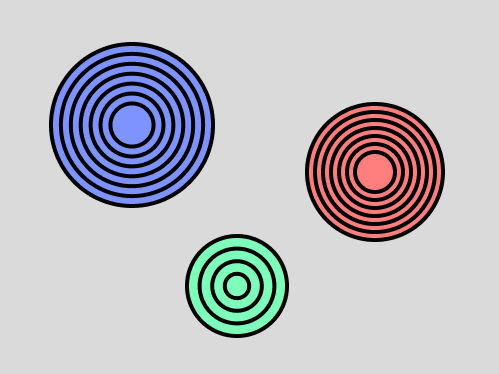

In [4]:
# PREVIEW
!yes | cp -rf base.pnm image.pnm
!./main image.pnm 0
show_pnm('image.pnm')

(500 x 374)


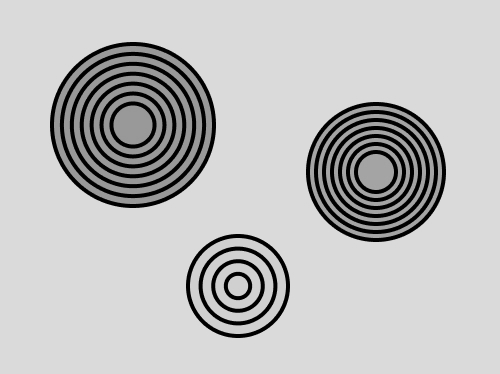

In [5]:
show_pnm('out_gray.pnm')

(500 x 374)


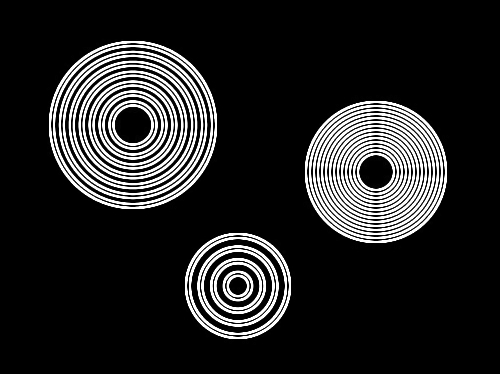

In [6]:
show_pnm('out_edge.pnm')

(500 x 374)


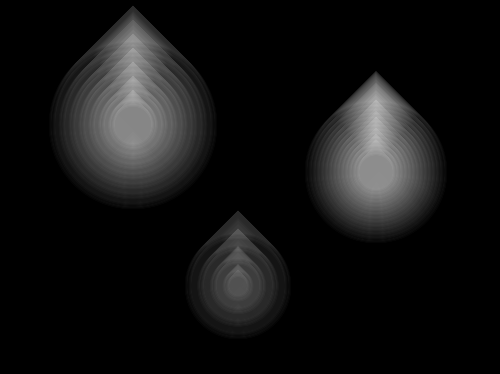

In [7]:
show_pnm('out_minEnergy.pnm')

#### Compare

Seam Carving is running...
> Removed 180 seams
> Using HOST
> Processing time: 24115.384766 ms
>>> Completed!
(320 x 374)


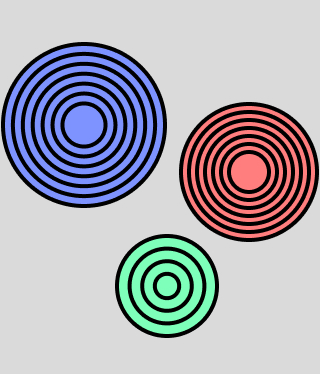

In [8]:
# HOST
!yes | cp -rf base.pnm image.pnm
!./main image.pnm 1 180
show_pnm('image.pnm')

Seam Carving is running...
> Removed 180 seams
> Using DEVICE
> Processing time: 20419.623047 ms
>>> Completed!
(320 x 374)


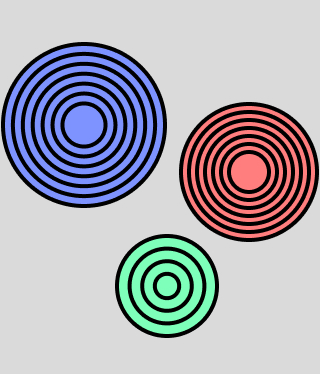

In [9]:
# DEVICE
!yes | cp -rf base.pnm image.pnm
!./main image.pnm 2 180 32 32
show_pnm('image.pnm')

Seam Carving is running...
> Removed 180 seams
> Using DEVICE (OPTIMIZE 1)
> Processing time: 14129.312500 ms
>>> Completed!
(320 x 374)


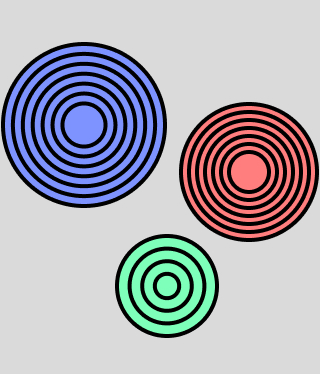

In [10]:
# DEVICE (OTP 1)
!yes | cp -rf base.pnm image.pnm
!./main image.pnm 3 180 32 32
show_pnm('image.pnm')

Seam Carving is running...
> Removed 180 seams
> Using DEVICE (OPTIMIZE 2)
> Processing time: 14489.174805 ms
>>> Completed!
(320 x 374)


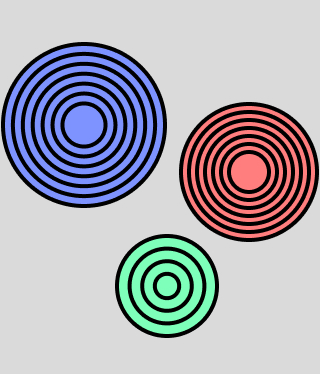

In [11]:
# # DEVICE (OTP 2)
!yes | cp -rf base.pnm image.pnm
!./main image.pnm 4 180 32 32 4
show_pnm('image.pnm')

### Test case 1: `tower.pnm`

#### Preview

(589 x 400)


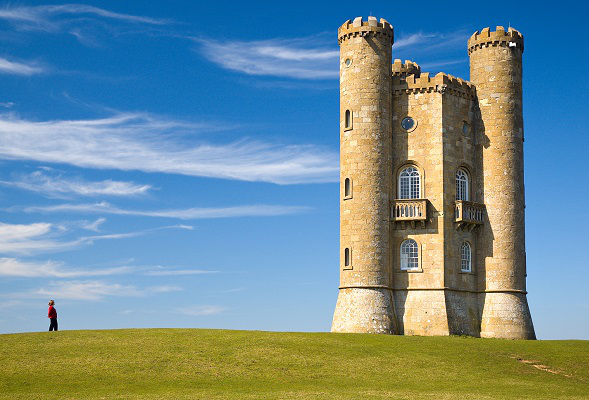

In [12]:
# PREVIEW
!yes | cp -rf tower.pnm image.pnm
!./main image.pnm 0
show_pnm('image.pnm')

(590 x 400)


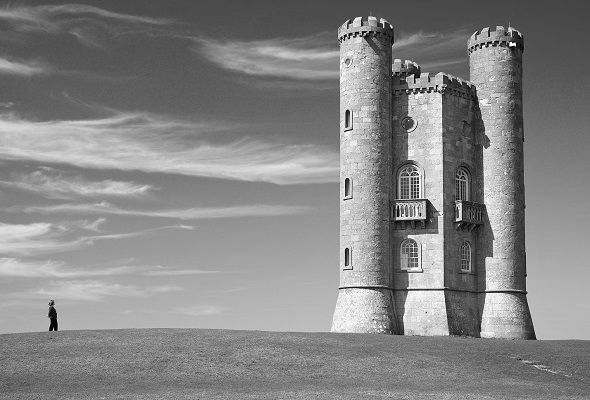

In [13]:
show_pnm('out_gray.pnm')

(590 x 400)


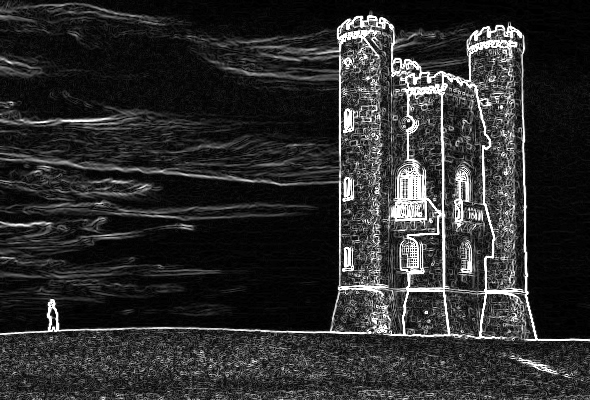

In [14]:
show_pnm('out_edge.pnm')

(590 x 400)


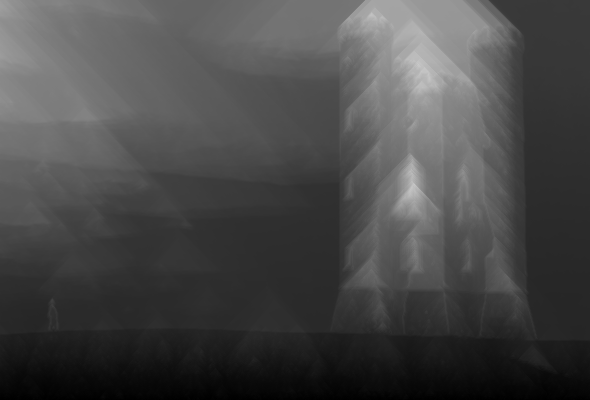

In [15]:
show_pnm('out_minEnergy.pnm')

#### Compare

Seam Carving is running...
> Removed 190 seams
> Using HOST
> Processing time: 34110.835938 ms
>>> Completed!
(400 x 400)


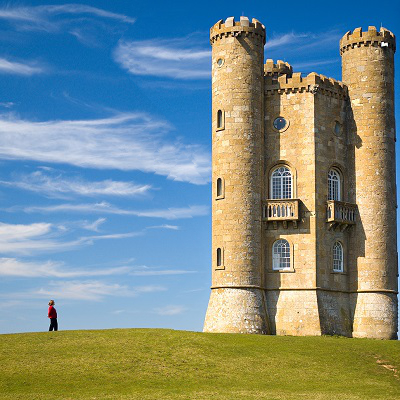

In [16]:
# HOST
!yes | cp -rf tower.pnm image.pnm
!./main image.pnm 1 190
show_pnm('image.pnm')

Seam Carving is running...
> Removed 190 seams
> Using DEVICE
> Processing time: 27821.591797 ms
>>> Completed!
(400 x 400)


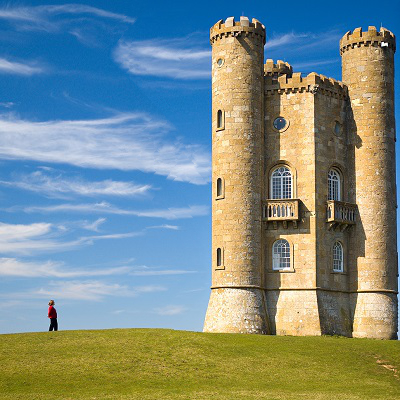

In [17]:
# DEVICE
!yes | cp -rf tower.pnm image.pnm
!./main image.pnm 2 190 32 32
show_pnm('image.pnm')

Seam Carving is running...
> Removed 190 seams
> Using DEVICE (OPTIMIZE 1)
> Processing time: 19630.414062 ms
>>> Completed!
(400 x 400)


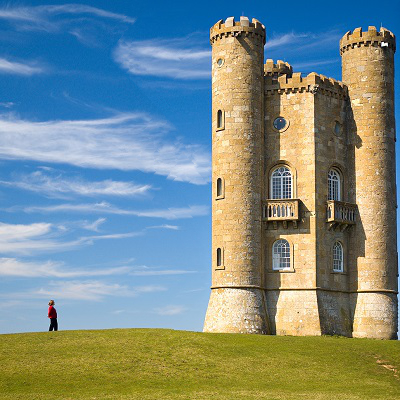

In [18]:
# DEVICE (OTP 1)
!yes | cp -rf tower.pnm image.pnm
!./main image.pnm 3 190 32 32
show_pnm('image.pnm')

Seam Carving is running...
> Removed 190 seams
> Using DEVICE (OPTIMIZE 2)
> Processing time: 19758.597656 ms
>>> Completed!
(400 x 400)


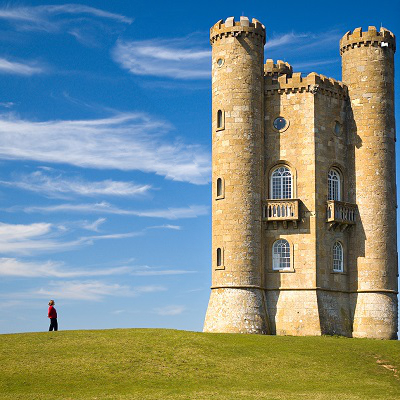

In [19]:
# # DEVICE (OTP 2)
!yes | cp -rf tower.pnm image.pnm
!./main image.pnm 4 190 32 32 4
show_pnm('image.pnm')

### Test case 2: `dali.pnm`

#### Preview

(599 x 400)


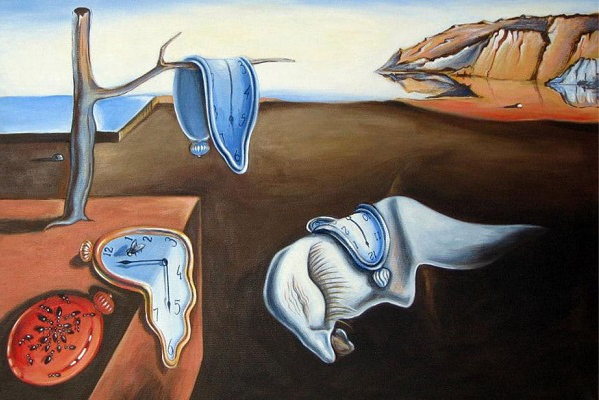

In [20]:
# PREVIEW
!yes | cp -rf dali.pnm image.pnm
!./main image.pnm 0
show_pnm('image.pnm')

(600 x 400)


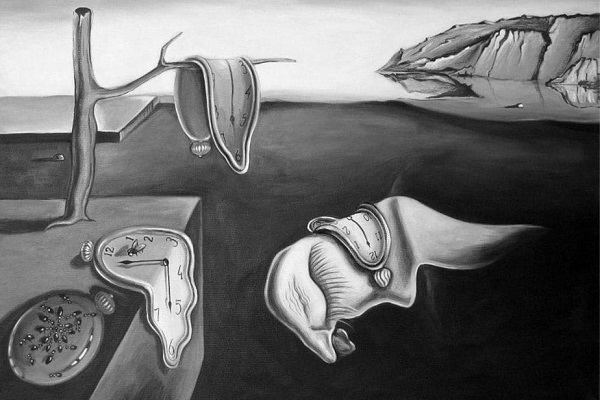

In [21]:
show_pnm('out_gray.pnm')

(600 x 400)


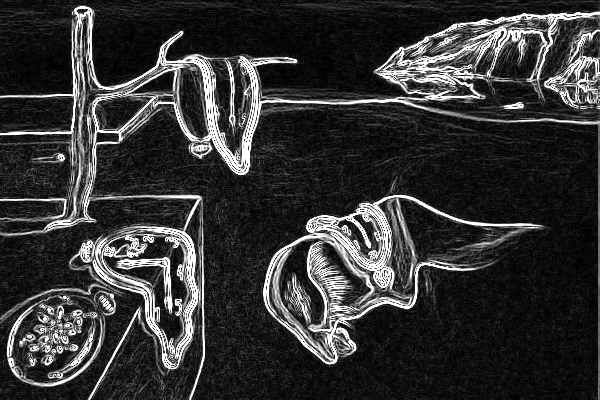

In [22]:
show_pnm('out_edge.pnm')

(600 x 400)


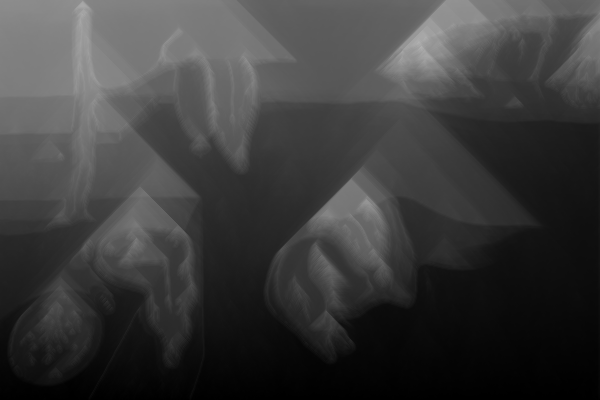

In [23]:
show_pnm('out_minEnergy.pnm')

#### Compare

Seam Carving is running...
> Removed 150 seams
> Using HOST
> Processing time: 27172.099609 ms
>>> Completed!
(450 x 400)


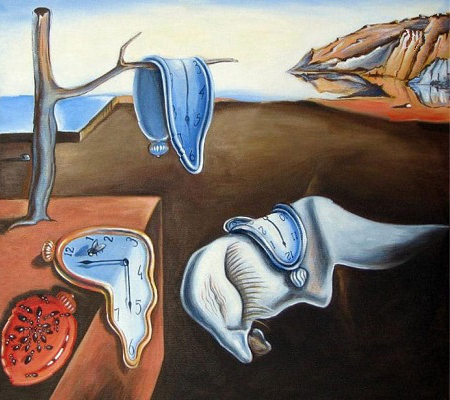

In [24]:
# HOST
!yes | cp -rf dali.pnm image.pnm
!./main image.pnm 1 150
show_pnm('image.pnm')

Seam Carving is running...
> Removed 150 seams
> Using DEVICE
> Processing time: 23243.015625 ms
>>> Completed!
(450 x 400)


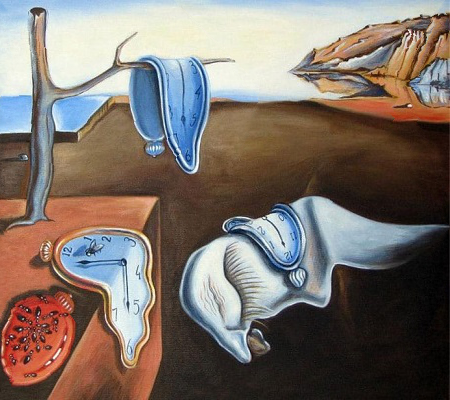

In [25]:
# DEVICE
!yes | cp -rf dali.pnm image.pnm
!./main image.pnm 2 150 32 32
show_pnm('image.pnm')

Seam Carving is running...
> Removed 150 seams
> Using DEVICE (OPTIMIZE 1)
> Processing time: 16442.148438 ms
>>> Completed!
(450 x 400)


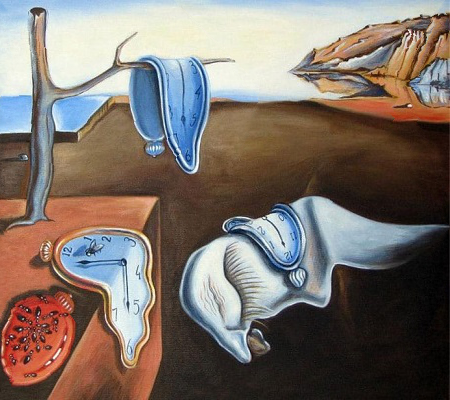

In [26]:
# DEVICE (OTP 1)
!yes | cp -rf dali.pnm image.pnm
!./main image.pnm 3 150 32 32
show_pnm('image.pnm')

Seam Carving is running...
> Removed 150 seams
> Using DEVICE (OPTIMIZE 2)
> Processing time: 16115.042969 ms
>>> Completed!
(450 x 400)


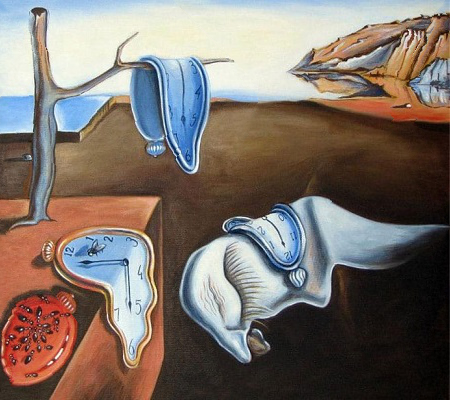

In [27]:
# # DEVICE (OTP 2)
!yes | cp -rf dali.pnm image.pnm
!./main image.pnm 4 150 32 32 4
show_pnm('image.pnm')

### Test case 3: `monalisa.pnm`

#### Preview

(374 x 500)


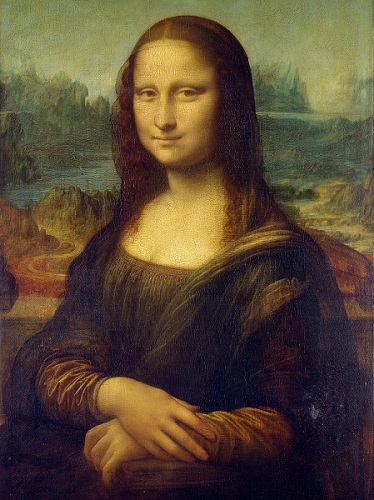

In [28]:
# PREVIEW
!yes | cp -rf monalisa.pnm image.pnm
!./main image.pnm 0
show_pnm('image.pnm')

(375 x 500)


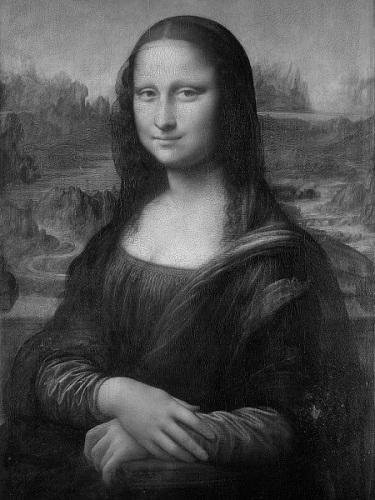

In [29]:
show_pnm('out_gray.pnm')

(375 x 500)


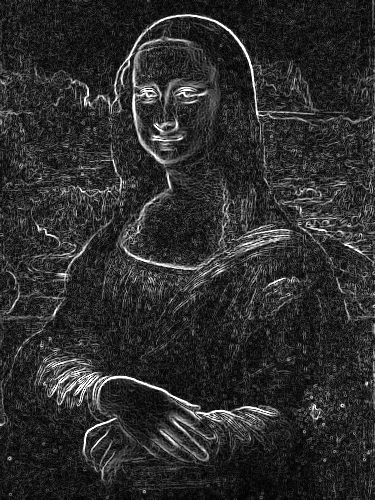

In [30]:
show_pnm('out_edge.pnm')

(375 x 500)


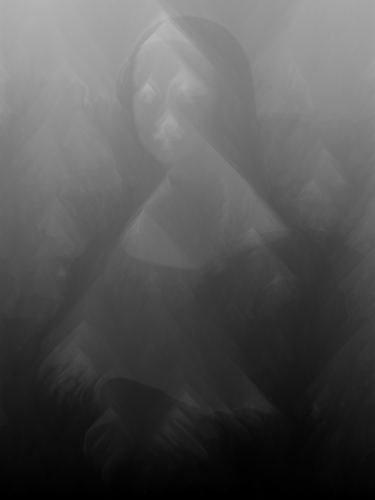

In [31]:
show_pnm('out_minEnergy.pnm')

#### Compare

Seam Carving is running...
> Removed 150 seams
> Using HOST
> Processing time: 19785.679688 ms
>>> Completed!
(225 x 500)


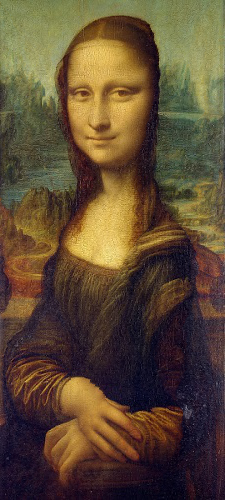

In [32]:
# HOST
!yes | cp -rf monalisa.pnm image.pnm
!./main image.pnm 1 150
show_pnm('image.pnm')

Seam Carving is running...
> Removed 150 seams
> Using DEVICE
> Processing time: 16631.818359 ms
>>> Completed!
(225 x 500)


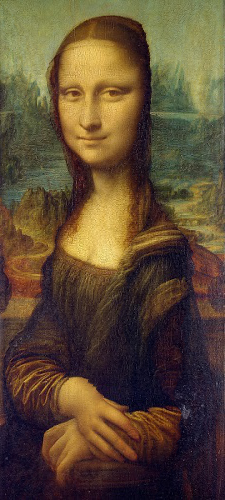

In [33]:
# DEVICE
!yes | cp -rf monalisa.pnm image.pnm
!./main image.pnm 2 150 32 32
show_pnm('image.pnm')

Seam Carving is running...
> Removed 150 seams
> Using DEVICE (OPTIMIZE 1)
> Processing time: 11411.922852 ms
>>> Completed!
(225 x 500)


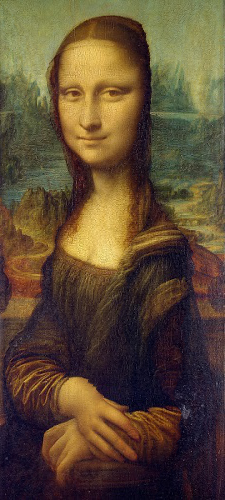

In [34]:
# DEVICE (OTP 1)
!yes | cp -rf monalisa.pnm image.pnm
!./main image.pnm 3 150 32 32
show_pnm('image.pnm')

Seam Carving is running...
> Removed 150 seams
> Using DEVICE (OPTIMIZE 2)
> Processing time: 11308.666992 ms
>>> Completed!
(225 x 500)


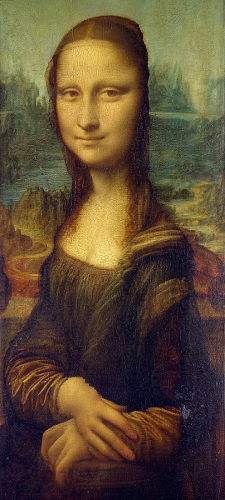

In [35]:
# # DEVICE (OTP 2)
!yes | cp -rf monalisa.pnm image.pnm
!./main image.pnm 4 150 32 32 4
show_pnm('image.pnm')